In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import imageio
from skimage.transform import rescale
from matplotlib import pyplot as plt
import imageio

In [2]:
class generator(nn.Module):
    def __init__(self):
        super(generator, self).__init__()
               
    def forward(self, x):
        x = self.generator(x)
        x = F.interpolate(x, scale_factor=2)
        x = F.relu(x)
        x = self.generator_2(x)
        return x

In [3]:
model = torch.load('../data/models/1_1_x2_31.51714700146426.pt')
model.eval().cuda()

generator(
  (generator): Sequential(
    (0): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): ReLU()
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU()
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): Conv2d(64, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (generator_2): Sequential(
    (0): Conv2d(256, 3, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): Sigmoid()
  )
)

# x2

In [14]:
def plot_x2(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(20, 20))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai = model.forward(torch.tensor(image.reshape(1, image.shape[0], image.shape[1], 3), device=torch.device('cuda:0'), dtype = torch.float32).transpose(1, 3))
    plt.subplot(1,2,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(1,2,2)
    plt.title(f'AI {int(image.shape[0] * 2)}x{int(image.shape[1] * 2)}')
    plt.imshow(image_ai.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 2), int(image.shape[1] * 2), 3), interpolation='none')
    plt.show()
    imageio.imwrite(f'../data/eval/scaled/x2_{image_file}.jpg', image_ai.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 2), int(image.shape[1] * 2), 3))
    del image, image_ai
    torch.cuda.empty_cache()

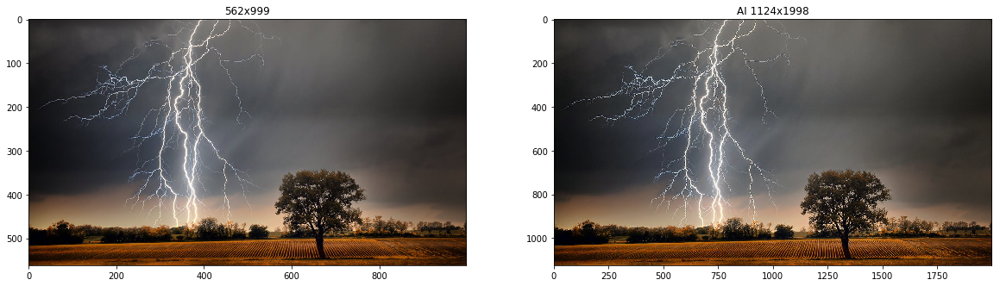

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [15]:
plot_x2('shutterstock_151812536.1000x562.jpg')

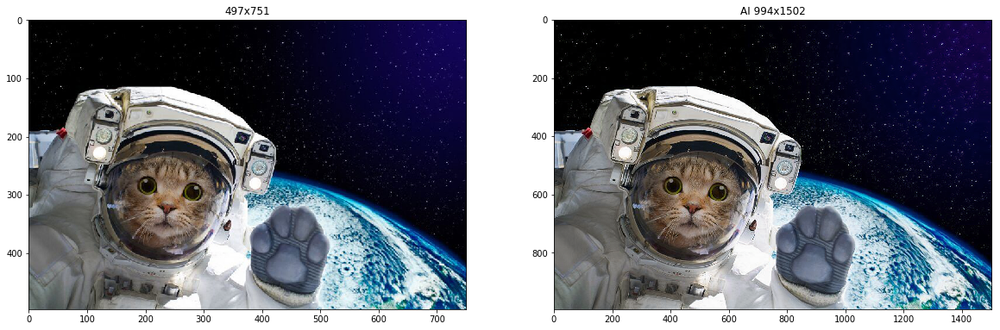

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [17]:
plot_x2('astronautenkatze-im-weltall-751x497.jpg')

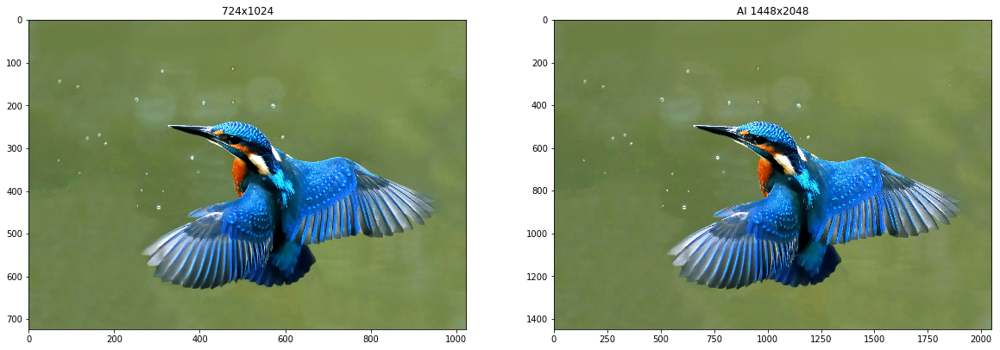

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [18]:
plot_x2('Natur-1024x724-49bfd77c2e142c86.jpg')

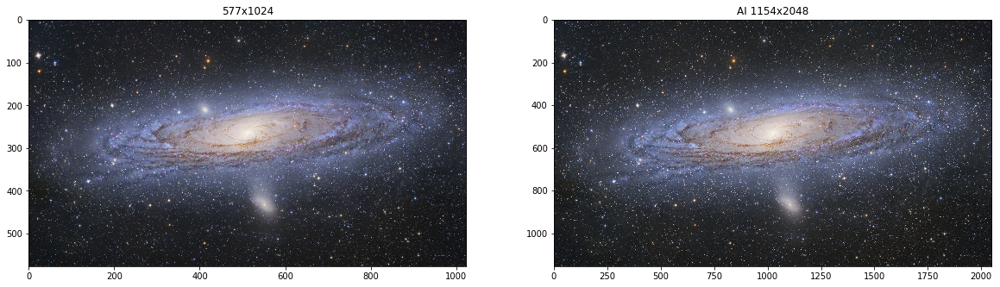

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [19]:
plot_x2('universe__1024x577.jpeg')

# x4

In [20]:
def plot_x4(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(20, 20))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai_150 = model.forward(torch.tensor(image.reshape(1,  image.shape[0],  image.shape[1], 3), device = torch.device('cuda:0'), dtype = torch.float32).transpose(1, 3))
    image_ai = model.forward(image_ai_150)
    del image_ai_150
    torch.cuda.empty_cache()
    plt.subplot(1,2,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(1,2,2)
    plt.title(f'AI {int(image.shape[0] * 4)}x{int(image.shape[1] * 4)}')
    plt.imshow(image_ai.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 4), int(image.shape[1] * 4), 3), interpolation='none')
    plt.show()
    imageio.imwrite(f'../data/eval/scaled/x4_{image_file}.jpg', image_ai.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 4), int(image.shape[1] * 4), 3))
    del image, image_ai
    torch.cuda.empty_cache()

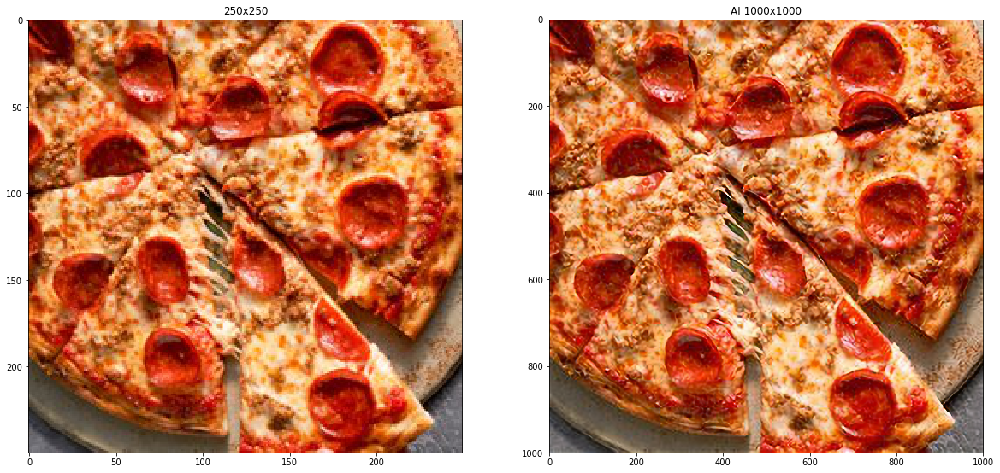

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [21]:
plot_x4('ls.jpg')

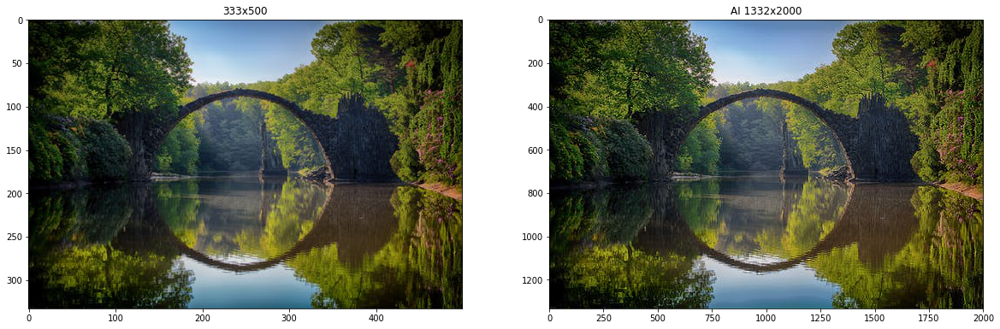

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [22]:
plot_x4('pexels-photo-814499.jpeg')

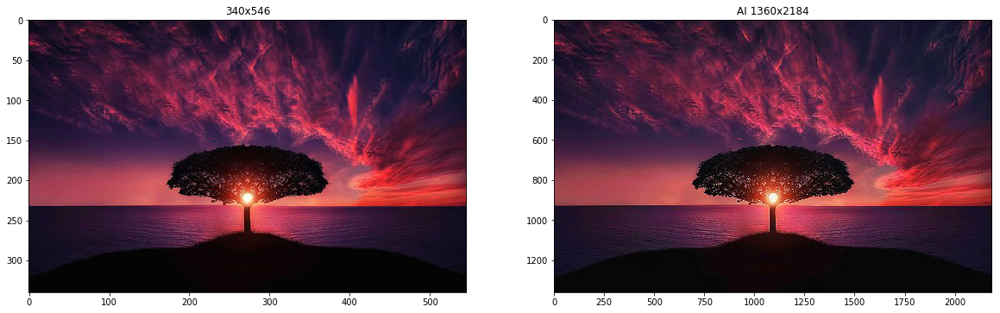

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [23]:
plot_x4('tree-736885__340.jpg')

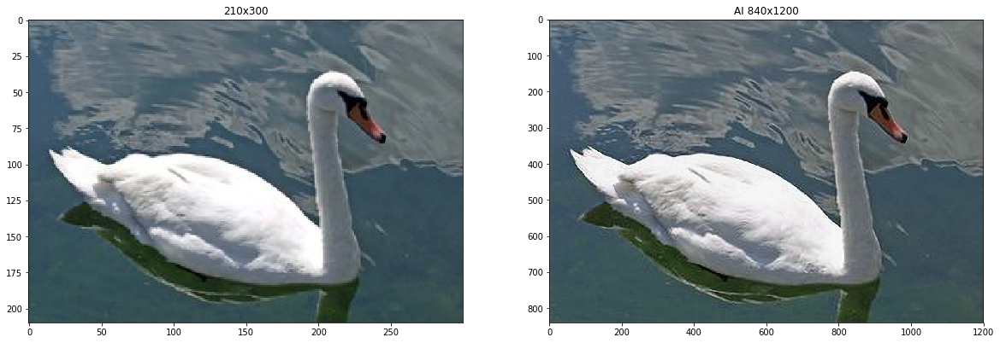

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [24]:
plot_x4('300px-Schwan1.jpg')

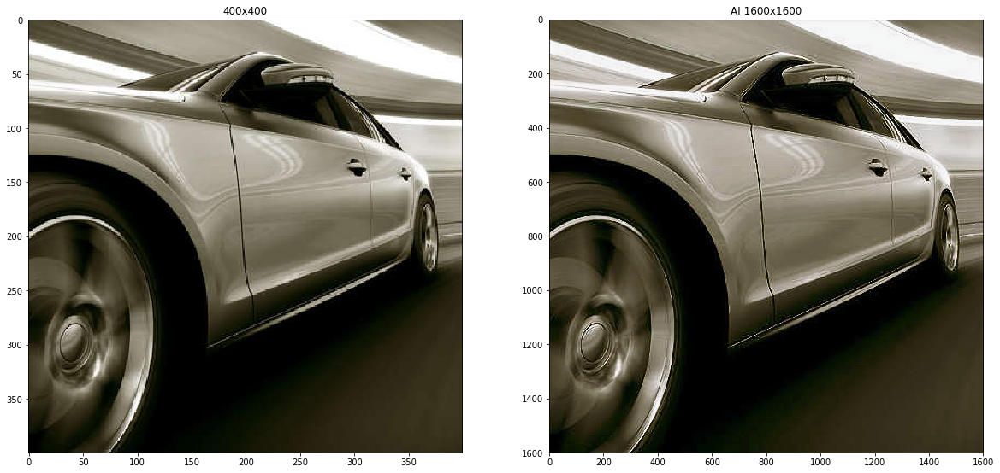

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [25]:
plot_x4('banner-1174143D-400x400.jpg')

# x8

In [26]:
def plot_x8(image_file):
    directory = '../data/eval'
    plt.figure(1, figsize=(20, 20))
    image = imageio.imread(f'{directory}/{image_file}')
    image = rescale(image=image, scale=1, multichannel=True, anti_aliasing=True)
    image_ai_60 = model.forward(torch.tensor(image.reshape(1, image.shape[0],  image.shape[1], 3), device = torch.device('cuda:0'), dtype = torch.float32).transpose(1, 3))
    image_ai_120 = model.forward(image_ai_60)
    del image_ai_60
    torch.cuda.empty_cache()
    image_ai_240 = model.forward(image_ai_120)
    del image_ai_120
    torch.cuda.empty_cache()
    plt.subplot(1,2,1) 
    plt.title(f'{image.shape[0]}x{image.shape[1]}')
    plt.imshow(image, interpolation='none')
    plt.subplot(1,2,2)
    plt.title(f'AI {int(image.shape[0] * 8)}x{int(image.shape[1] * 8)}')
    plt.imshow(image_ai_240.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 8), int(image.shape[1] * 8), 3), interpolation='none')
    plt.show()
    imageio.imwrite(f'../data/eval/scaled/x8_{image_file}.jpg', image_ai_240.transpose(1, 3).cpu().detach().numpy().reshape(int(image.shape[0] * 8), int(image.shape[1] * 8), 3))
    del image, image_ai_240
    torch.cuda.empty_cache()

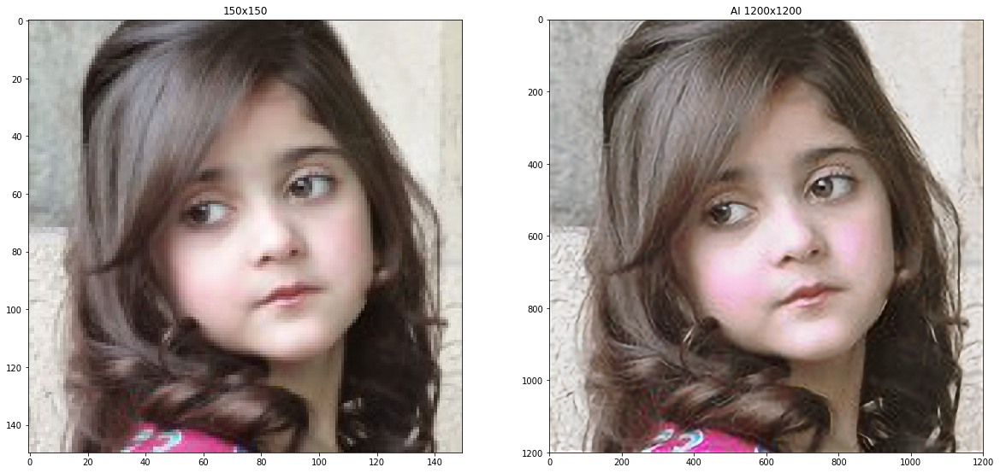

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [27]:
plot_x8('girl-150x150.jpg')

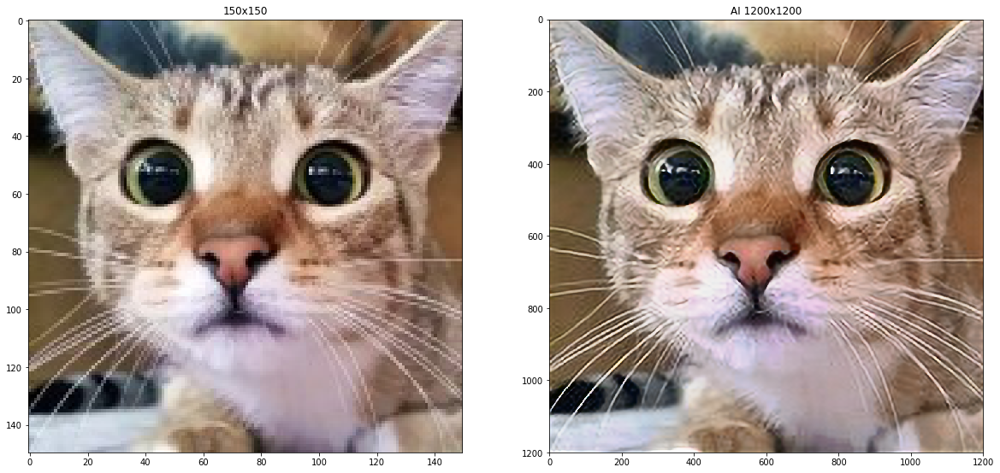

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [28]:
plot_x8('THE-CAT-WATCHING-HORROR-MOVIE-TOGEPI-Cute4Kind-150x150.jpg')

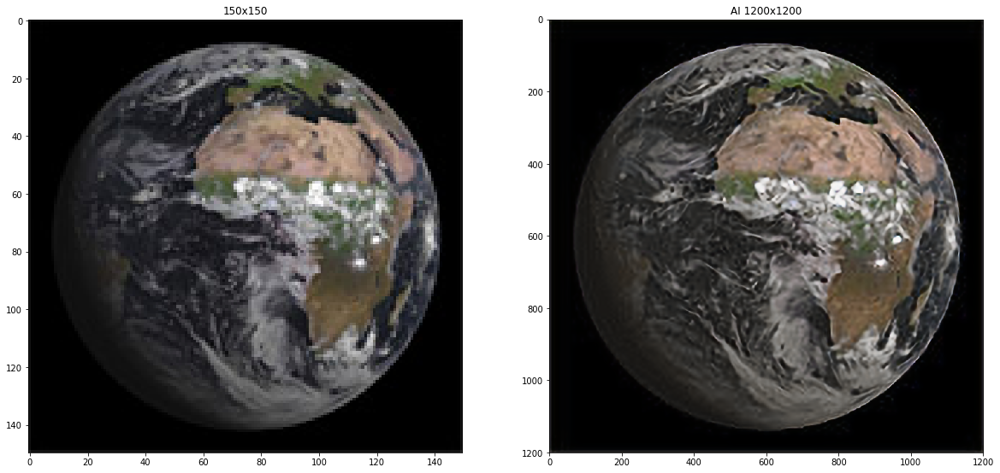

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [29]:
plot_x8('TN_150_MSG3-FIRSTIMAGE.jpg')

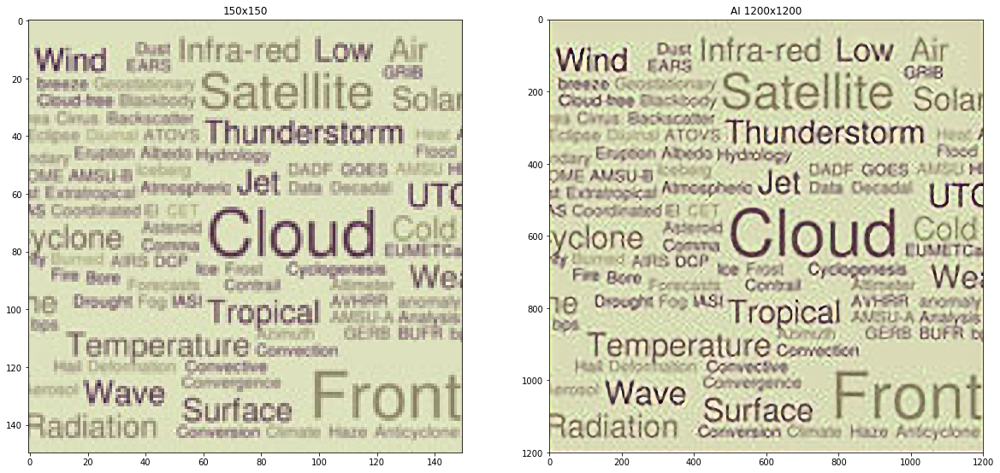

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [30]:
plot_x8('TN_IMAGE_GLOSSARY.jpg')

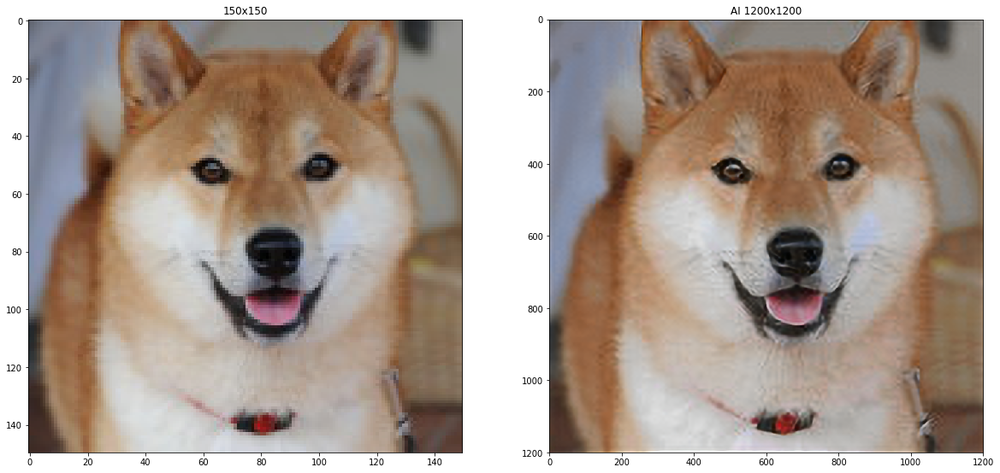

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [31]:
plot_x8('Shiba_inu_taiki-150x150.jpg')

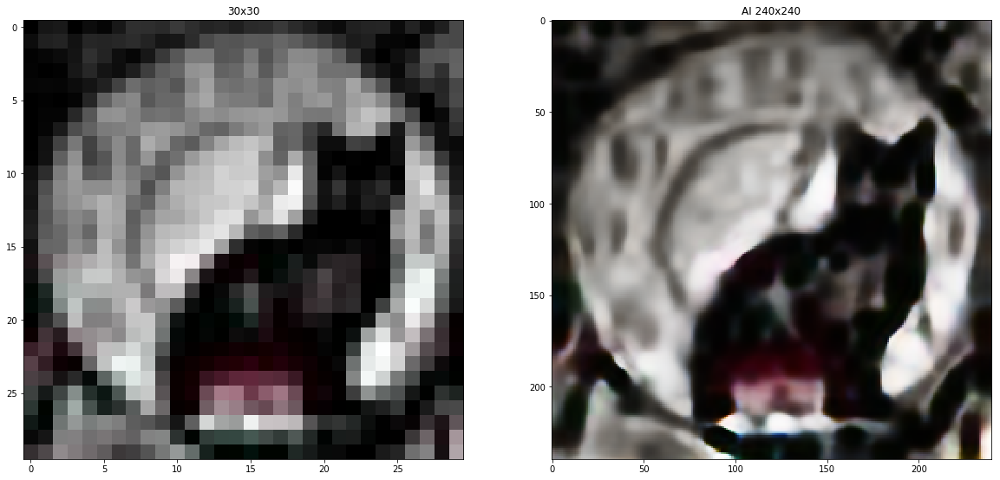

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [32]:
plot_x8('51eanE9gIrL._SL30_.jpg')

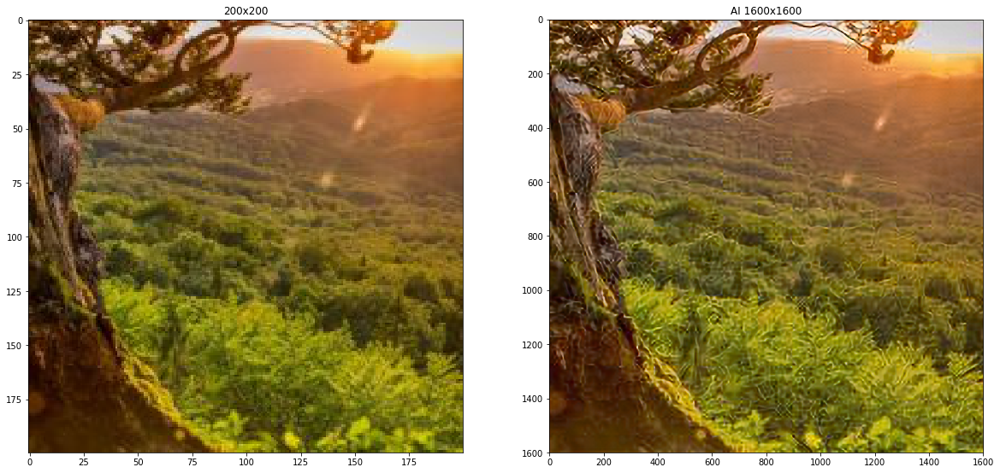

Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [33]:
plot_x8('4M7A8046-Bearbeitet-1d24ff48.jpg')